<a href="https://colab.research.google.com/github/LokKaturi/Covid-Mask-Detection-Using-Tranfer-Learning/blob/main/Covid%20Mask%20Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!unzip "/content/dataset" -d ""

Streaming output truncated to the last 5000 lines.
  inflating: Face Mask Dataset/Train/WithoutMask/1855.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1856.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1857.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1858.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1859.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1860.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1861.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1862.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1863.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1864.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1865.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1866.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1867.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1868.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1869.png  
  inflating: Face Mask Dataset/Train/WithoutMask/

In [ ]:
import numpy as np
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import seaborn as sns
from keras import callbacks
from sklearn.metrics import accuracy_score
from os import listdir
from os.path import isfile, join

In [ ]:
# pipeline parameters
BATCH_SIZE = 32
IMG_SIZE = (256, 256)
PATH = './Face Mask Dataset/'

In [ ]:
# train dataset
train_dir = os.path.join(PATH, 'Train')

train_ds = tf.keras.utils.image_dataset_from_directory(train_dir,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE,
                                                            shuffle=True)

Found 10000 files belonging to 2 classes.


In [ ]:
# validation dataset
validation_dir = os.path.join(PATH, 'Validation')

validation_ds = tf.keras.utils.image_dataset_from_directory(validation_dir,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE,
                                                            shuffle=True)

Found 800 files belonging to 2 classes.


In [ ]:
# test dataset
test_dir = os.path.join(PATH, 'Test')

test_ds = tf.keras.utils.image_dataset_from_directory(test_dir,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE,
                                                            shuffle=False)

Found 992 files belonging to 2 classes.


In [ ]:
# class names
class_names = train_ds.class_names
print(class_names)

['WithMask', 'WithoutMask']


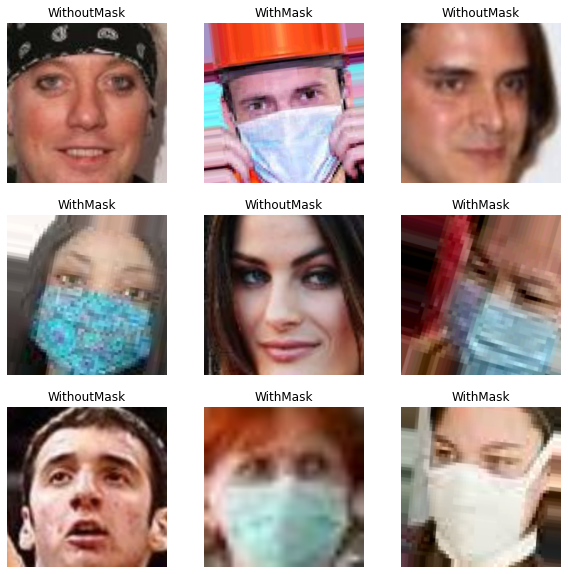

In [ ]:
# data visualization
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
# autotune buffer to avoid I/0 block
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
validation_ds = validation_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
num_classes = 2

model = tf.keras.Sequential([
  tf.keras.layers.Rescaling(1./255),
  tf.keras.layers.Conv2D(32, 3, activation='relu', padding='same'),
  tf.keras.layers.MaxPooling2D(pool_size=(2,2)), #128x128
  tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same'),
  tf.keras.layers.MaxPooling2D(pool_size=(2,2)), #64x64
  tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same'),
  tf.keras.layers.MaxPooling2D(pool_size=(2,2)), #32x32
  tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same'),
  tf.keras.layers.MaxPooling2D(pool_size=(2,2)), #16x16
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(256, activation='relu'),
  tf.keras.layers.Dense(num_classes, activation='sigmoid')
])

model.compile(
  optimizer='adam',
  loss=tf.losses.SparseCategoricalCrossentropy(),
  metrics=['accuracy'])

In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
# defining callback function to avoid overfit
earlystopping = callbacks.EarlyStopping(monitor ="val_loss", 
                                        mode ="min", patience = 6, 
                                        restore_best_weights = True, verbose=1)
best_model = callbacks.ModelCheckpoint('.mdl_wts.hdf5', save_best_only=True, monitor='val_loss', mode='min')

In [ ]:
model.fit(
  train_ds,
  validation_data=validation_ds,
  epochs=50,
  callbacks =[earlystopping,best_model,tensorboard_callback]
)

Epoch 1/50
313/313 [==============================] - 26s 83ms/step - loss: 0.0269 - accuracy: 0.9917 - val_loss: 0.0329 - val_accuracy: 0.9862
Epoch 2/50
313/313 [==============================] - 25s 81ms/step - loss: 0.0163 - accuracy: 0.9956 - val_loss: 0.0152 - val_accuracy: 0.9950
Epoch 3/50
313/313 [==============================] - 25s 81ms/step - loss: 0.0040 - accuracy: 0.9988 - val_loss: 0.0185 - val_accuracy: 0.9925
Epoch 4/50
313/313 [==============================] - 25s 81ms/step - loss: 0.0062 - accuracy: 0.9979 - val_loss: 0.0134 - val_accuracy: 0.9950
Epoch 5/50
313/313 [==============================] - 25s 81ms/step - loss: 0.0064 - accuracy: 0.9989 - val_loss: 0.0112 - val_accuracy: 0.9962
Epoch 6/50
313/313 [==============================] - 25s 81ms/step - loss: 8.6230e-04 - accuracy: 0.9998 - val_loss: 0.0126 - val_accuracy: 0.9962
Epoch 7/50
313/313 [==============================] - 25s 81ms/step - loss: 2.1746e-04 - accuracy: 0.9999 - val_loss: 0.0115 - val_a

Test set prediction accuracy

In [ ]:
e = model.evaluate(test_ds)

print(f'Test set accuracy: {"{0:.2f}".format(e[1]*100)}%')

31/31 [==============================] - 1s 39ms/step - loss: 0.0603 - accuracy: 0.9919
Test set accuracy: 99.19%


Confusion Matrix

In [ ]:
test_pred = model.predict(test_ds)
test_pred = np.argmax(test_pred,axis = 1)
test_labels = np.concatenate([y for x, y in test_ds], axis=0) 

31/31 [==============================] - 1s 38ms/step


Text(0.5, 1.0, 'Confusion Matrix - Test Set')

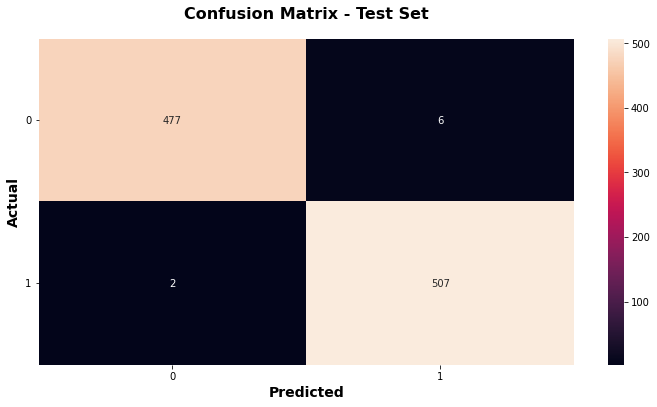

In [ ]:
plt.figure(figsize=(12, 6))
ax = sns.heatmap(tf.math.confusion_matrix(
    test_labels,
    test_pred,
    num_classes=None,
    weights=None,
    dtype=tf.dtypes.int32,
    name=None
),annot = True,
  fmt="d")
ax.set_xlabel('Predicted',fontsize = 14,weight = 'bold')
ax.set_xticklabels(ax.get_xticklabels(),rotation =0);

ax.set_ylabel('Actual',fontsize = 14,weight = 'bold') 
ax.set_yticklabels(ax.get_yticklabels(),rotation =0);
ax.set_title('Confusion Matrix - Test Set',fontsize = 16,weight = 'bold',pad=20)

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/ 

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image_dataset_from_directory

from tensorflow.keras.applications.resnet_v2 import ResNet101V2
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg16 import VGG16
from keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications import DenseNet201

from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from IPython.display import clear_output
import warnings
warnings.filterwarnings('ignore')

In [ ]:
train_dir = 'Face Mask Dataset/Train'
test_dir = 'Face Mask Dataset/Test'
val_dir = 'Face Mask Dataset/Validation'

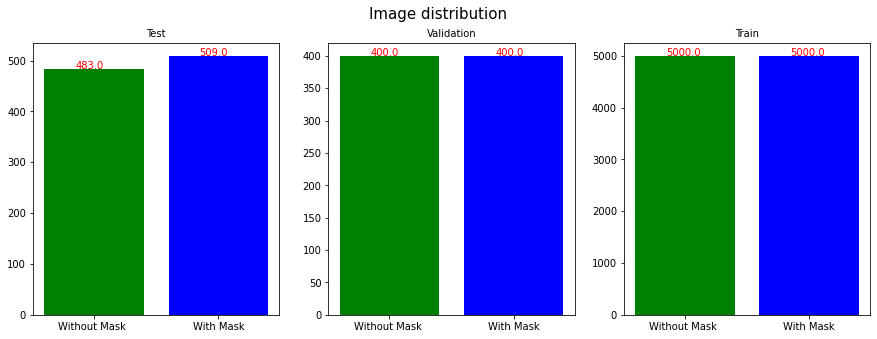

In [ ]:
path = 'Face Mask Dataset/'

CLASSES = ['Without Mask ','With Mask']

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for set_ in os.listdir(path):
    total = []
    ax = axes[os.listdir(path).index(set_)]
    for class_ in os.listdir(path+'/'+set_):
        count=len(os.listdir(path+'/'+set_+'/'+class_))
        total.append(count)
    ax.bar(CLASSES, total, color=['g','b'])
    ax.set_title(set_, size=10)
    for p in ax.patches:
        ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01),color='r')
plt.suptitle('Image distribution', size=15)
plt.show()

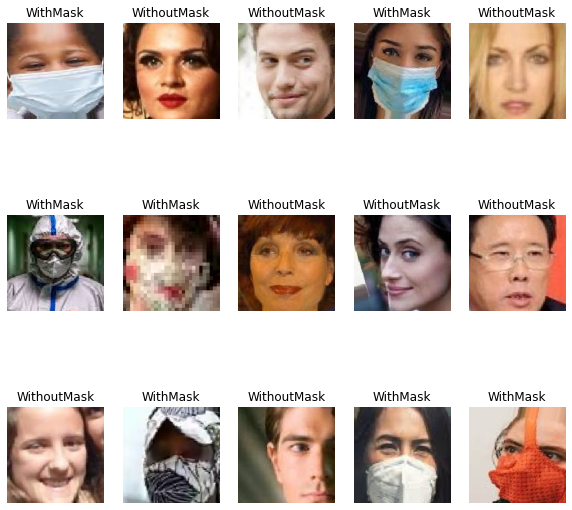

In [ ]:
data_train = image_dataset_from_directory(train_dir,labels='inferred',
                                       label_mode='binary',interpolation='nearest',image_size=[150,150],batch_size=64,
                                       shuffle=True)
classes_train = data_train.class_names
plt.figure(figsize=(10,10))
for img, label in data_train.take(1):
    for i in range(15):
        ax = plt.subplot(3,5,i+1)
        plt.imshow(img[i].numpy().astype('uint8'))
        plt.title(classes_train[int(label[i])])
        plt.axis('off')
        
clear_output()

Data Augmentation

Data augmentation is a process of artificially increasing the amount of data by generating new data points from existing data. This includes adding minor alterations to data or using machine learning models to generate new data points in the latent space of original data to amplify the dataset.

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   width_shift_range=0.2, 
                                   height_shift_range=0.2,
                                   zoom_range=0.25, 
                                   horizontal_flip=True, 
                                   samplewise_center=True, 
                                   samplewise_std_normalization=True,
                                   fill_mode='nearest')
test_datagen = ImageDataGenerator(rescale=1./255)

Transfer learning models

ResNet101V2

In [ ]:
# Image size is (256, 256) for ResNet
IMG_SIZE = (256, 256)


train_dataset = train_datagen.flow_from_directory(train_dir, target_size=(IMG_SIZE), 
                                         color_mode="rgb",
                                         batch_size=200, 
                                         shuffle=True,
                                         class_mode="categorical")

test_dataset = test_datagen.flow_from_directory(test_dir, target_size=(IMG_SIZE), 
                                         color_mode="rgb",
                                         batch_size=64, 
                                         shuffle=True,
                                         class_mode="categorical")

validation_dataset = train_datagen.flow_from_directory(val_dir, target_size=(IMG_SIZE), 
                                         color_mode="rgb",
                                         batch_size=64, 
                                         shuffle=True,
                                         class_mode="categorical")

Found 10000 images belonging to 2 classes.
Found 992 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


Loading pre-trained ResNet101V2 model but freezing the last layer

In [ ]:
resnet101v2 = ResNet101V2(weights='imagenet',include_top=False,input_shape=(256,256,3))
# make pre trained model into non trainable bcoz its takes much time
for layer in resnet101v2.layers:
    layer.trainable = False

Initialize the model in sequential

Adding a few layers and Dense layer with 2 unit to classify face mask images to identify the image either with mask or without mask.

In [ ]:
model = Sequential()
# add resnet101v2 model into our sequence model
model.add(resnet101v2)
# flatten the model
model.add(Flatten())
# Adding output layer
model.add(Dense(2,activation='sigmoid')) #two classes
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101v2 (Functional)    (None, 8, 8, 2048)        42626560  
                                                                 
 flatten_1 (Flatten)         (None, 131072)            0         
                                                                 
 dense_1 (Dense)             (None, 2)                 262146    
                                                                 
Total params: 42,888,706
Trainable params: 262,146
Non-trainable params: 42,626,560
_________________________________________________________________


In [ ]:
model.compile(optimizer=Adam(),
              loss='categorical_crossentropy',
              metrics = ['accuracy'])

In [ ]:
import tensorflow as tf
import datetime
from keras import callbacks

In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
# defining callback function to avoid overfit
earlystopping = callbacks.EarlyStopping(monitor ="val_loss", 
                                        mode ="min", patience = 6, 
                                        restore_best_weights = True, verbose=1)
best_model = callbacks.ModelCheckpoint('.mdl_wts.hdf5', save_best_only=True, monitor='val_loss', mode='min')

In [ ]:
resnet_history = model.fit(train_dataset,
                        validation_data=validation_dataset,
                        epochs=10,
                        verbose=1,callbacks =[earlystopping,best_model,tensorboard_callback])

Epoch 1/10
50/50 [==============================] - 132s 3s/step - loss: 0.0124 - accuracy: 0.9964 - val_loss: 0.0118 - val_accuracy: 0.9950
Epoch 2/10
50/50 [==============================] - 128s 3s/step - loss: 0.0111 - accuracy: 0.9969 - val_loss: 0.0136 - val_accuracy: 0.9950
Epoch 3/10
50/50 [==============================] - 129s 3s/step - loss: 0.0108 - accuracy: 0.9969 - val_loss: 0.0132 - val_accuracy: 0.9962
Epoch 4/10
50/50 [==============================] - 130s 3s/step - loss: 0.0101 - accuracy: 0.9967 - val_loss: 0.0091 - val_accuracy: 0.9975
Epoch 5/10
50/50 [==============================] - 129s 3s/step - loss: 0.0091 - accuracy: 0.9976 - val_loss: 0.0287 - val_accuracy: 0.9937
Epoch 6/10
50/50 [==============================] - 130s 3s/step - loss: 0.0107 - accuracy: 0.9970 - val_loss: 0.0120 - val_accuracy: 0.9987
Epoch 7/10
50/50 [==============================] - 131s 3s/step - loss: 0.0087 - accuracy: 0.9976 - val_loss: 0.0131 - val_accuracy: 0.9962
Epoch 8/10
50

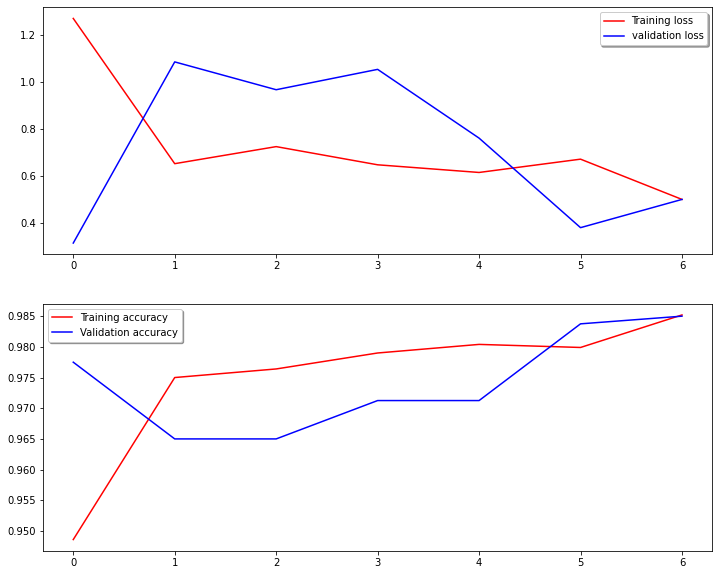

In [ ]:

# Loss
fig, ax = plt.subplots(2,1, figsize=(12, 10))
ax[0].plot(resnet_history.history['loss'], color='r', label="Training loss")
ax[0].plot(resnet_history.history['val_loss'], color='b', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

# Accuracy
ax[1].plot(resnet_history.history['accuracy'], color='r', label="Training accuracy")
ax[1].plot(resnet_history.history['val_accuracy'], color='b',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [ ]:
resnet101v2 = model.evaluate(test_dataset)

print(f'Test set accuracy: {"{0:.2f}".format(resnet101v2[1]*100)}%')

16/16 [==============================] - 6s 343ms/step - loss: 0.1619 - accuracy: 0.9375
Test set accuracy: 93.75%


In [ ]:
IMG_SIZE = (224, 224)


train_dataset = train_datagen.flow_from_directory(train_dir, target_size=(IMG_SIZE), 
                                         color_mode="rgb",
                                         batch_size=200, 
                                         shuffle=True,
                                         class_mode="categorical")

test_dataset = test_datagen.flow_from_directory(test_dir, target_size=(IMG_SIZE), 
                                         color_mode="rgb",
                                         batch_size=64, 
                                         shuffle=True,
                                         class_mode="categorical")

validation_dataset = train_datagen.flow_from_directory(val_dir, target_size=(IMG_SIZE), 
                                         color_mode="rgb",
                                         batch_size=64, 
                                         shuffle=True,
                                         class_mode="categorical")

Found 10000 images belonging to 2 classes.
Found 992 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


In [ ]:
vgg19 = VGG19(weights='imagenet',include_top=False,input_shape=(224,224,3))

for layer in vgg19.layers:
    layer.trainable = False
    
model = Sequential()
model.add(vgg19)
model.add(Flatten())
model.add(Dense(2,activation='sigmoid'))
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_4 (Flatten)         (None, 25088)             0         
                                                                 
 dense_4 (Dense)             (None, 2)                 50178     
                                                                 
Total params: 20,074,562
Trainable params: 50,178
Non-trainable params: 20,024,384
_________________________________________________________________


In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
# defining callback function to avoid overfit
earlystopping = callbacks.EarlyStopping(monitor ="val_loss", 
                                        mode ="min", patience = 6, 
                                        restore_best_weights = True, verbose=1)
best_model = callbacks.ModelCheckpoint('.mdl_wts.hdf5', save_best_only=True, monitor='val_loss', mode='min')

In [ ]:
model.compile(optimizer=Adam(),
              loss='categorical_crossentropy',
              metrics = ['accuracy'])

In [ ]:
vgg19_history = model.fit(train_dataset,
                          validation_data=validation_dataset,
                          epochs=10,
                          verbose=1,callbacks =[earlystopping,best_model,tensorboard_callback])

Epoch 1/10
50/50 [==============================] - 133s 3s/step - loss: 0.2346 - accuracy: 0.9105 - val_loss: 0.0538 - val_accuracy: 0.9812
Epoch 2/10
50/50 [==============================] - 131s 3s/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0292 - val_accuracy: 0.9887
Epoch 3/10
50/50 [==============================] - 131s 3s/step - loss: 0.0305 - accuracy: 0.9898 - val_loss: 0.0319 - val_accuracy: 0.9887
Epoch 4/10
50/50 [==============================] - 130s 3s/step - loss: 0.0235 - accuracy: 0.9931 - val_loss: 0.0154 - val_accuracy: 0.9937
Epoch 5/10
50/50 [==============================] - 129s 3s/step - loss: 0.0218 - accuracy: 0.9939 - val_loss: 0.0157 - val_accuracy: 0.9925
Epoch 6/10
50/50 [==============================] - 130s 3s/step - loss: 0.0206 - accuracy: 0.9937 - val_loss: 0.0206 - val_accuracy: 0.9950
Epoch 7/10
50/50 [==============================] - 129s 3s/step - loss: 0.0235 - accuracy: 0.9928 - val_loss: 0.0123 - val_accuracy: 0.9975
Epoch 8/10
50

In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
# defining callback function to avoid overfit
earlystopping = callbacks.EarlyStopping(monitor ="val_loss", 
                                        mode ="min", patience = 6, 
                                        restore_best_weights = True, verbose=1)
best_model = callbacks.ModelCheckpoint('.mdl_wts.hdf5', save_best_only=True, monitor='val_loss', mode='min')

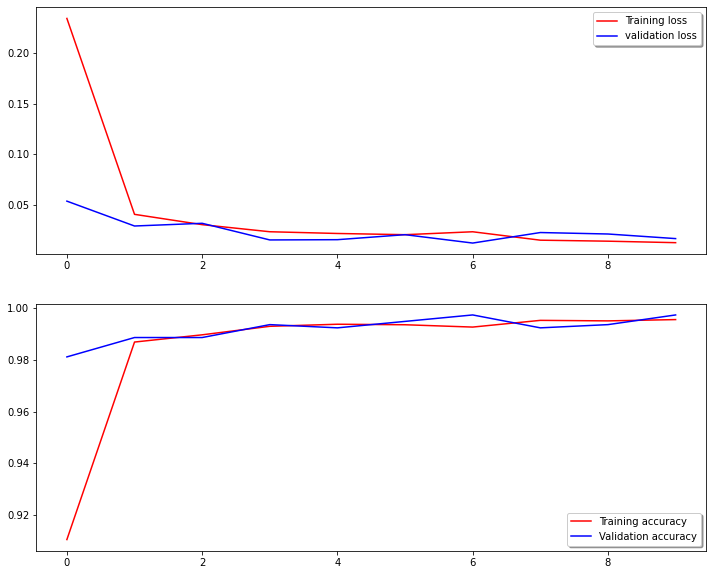

In [ ]:
# Loss
fig, ax = plt.subplots(2,1, figsize=(12, 10))
ax[0].plot(vgg19_history.history['loss'], color='r', label="Training loss")
ax[0].plot(vgg19_history.history['val_loss'], color='b', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

# Accuracy
ax[1].plot(vgg19_history.history['accuracy'], color='r', label="Training accuracy")
ax[1].plot(vgg19_history.history['val_accuracy'], color='b',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [ ]:
vgg19_accuracy = model.evaluate(test_dataset)

print(f'Test set accuracy: {"{0:.2f}".format(vgg19_accuracy[1]*100)}%')

16/16 [==============================] - 6s 330ms/step - loss: 0.1654 - accuracy: 0.9425
Test set accuracy: 94.25%


In [ ]:
IMG_SIZE = (224, 224)


train_dataset = train_datagen.flow_from_directory(train_dir, target_size=(IMG_SIZE), 
                                         color_mode="rgb",
                                         batch_size=200, 
                                         shuffle=True,
                                         class_mode="categorical")

test_dataset = test_datagen.flow_from_directory(test_dir, target_size=(IMG_SIZE), 
                                         color_mode="rgb",
                                         batch_size=64, 
                                         shuffle=True,
                                         class_mode="categorical")

validation_dataset = train_datagen.flow_from_directory(val_dir, target_size=(IMG_SIZE), 
                                         color_mode="rgb",
                                         batch_size=64, 
                                         shuffle=True,
                                         class_mode="categorical")

Found 10000 images belonging to 2 classes.
Found 992 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


In [ ]:
vgg16 = VGG16(weights='imagenet',include_top=False,input_shape=(224,224,3))

for layer in vgg16.layers:
    layer.trainable = False
    
model = Sequential()
model.add(vgg16)
model.add(Flatten())
model.add(Dense(2,activation='sigmoid'))
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_5 (Flatten)         (None, 25088)             0         
                                                                 
 dense_5 (Dense)             (None, 2)                 50178     
                                                                 
Total params: 14,764,866
Trainable params: 50,178
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
model.compile(optimizer=Adam(),
              loss='categorical_crossentropy',
              metrics = ['accuracy'])

In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
# defining callback function to avoid overfit
earlystopping = callbacks.EarlyStopping(monitor ="val_loss", 
                                        mode ="min", patience = 6, 
                                        restore_best_weights = True, verbose=1)
best_model = callbacks.ModelCheckpoint('.mdl_wts.hdf5', save_best_only=True, monitor='val_loss', mode='min')

In [ ]:
vgg16_history = model.fit(train_dataset,
                          validation_data=validation_dataset,
                          epochs=10,
                          verbose=1,callbacks =[earlystopping,best_model,tensorboard_callback])

Epoch 1/10
50/50 [==============================] - 128s 3s/step - loss: 0.0952 - accuracy: 0.9565 - val_loss: 0.0191 - val_accuracy: 0.9937
Epoch 2/10
50/50 [==============================] - 126s 2s/step - loss: 0.0265 - accuracy: 0.9917 - val_loss: 0.0205 - val_accuracy: 0.9962
Epoch 3/10
50/50 [==============================] - 125s 2s/step - loss: 0.0211 - accuracy: 0.9934 - val_loss: 0.0306 - val_accuracy: 0.9900
Epoch 4/10
50/50 [==============================] - 127s 3s/step - loss: 0.0178 - accuracy: 0.9946 - val_loss: 0.0145 - val_accuracy: 0.9962
Epoch 5/10
50/50 [==============================] - 127s 3s/step - loss: 0.0162 - accuracy: 0.9948 - val_loss: 0.0117 - val_accuracy: 0.9975
Epoch 6/10
50/50 [==============================] - 127s 3s/step - loss: 0.0135 - accuracy: 0.9958 - val_loss: 0.0129 - val_accuracy: 0.9975
Epoch 7/10
50/50 [==============================] - 126s 3s/step - loss: 0.0123 - accuracy: 0.9967 - val_loss: 0.0118 - val_accuracy: 0.9950
Epoch 8/10
50

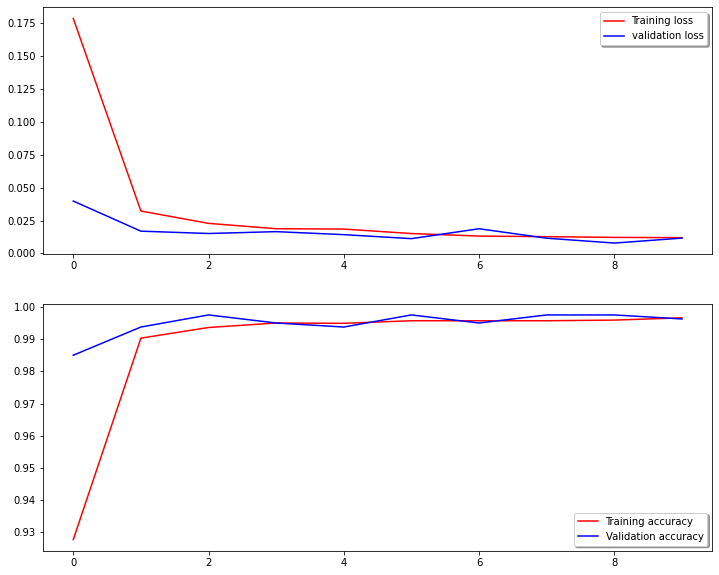

In [ ]:
# Loss
fig, ax = plt.subplots(2,1, figsize=(12, 10))
ax[0].plot(vgg16_history.history['loss'], color='r', label="Training loss")
ax[0].plot(vgg16_history.history['val_loss'], color='b', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

# Accuracy
ax[1].plot(vgg16_history.history['accuracy'], color='r', label="Training accuracy")
ax[1].plot(vgg16_history.history['val_accuracy'], color='b',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)  

In [ ]:
vgg16_accuracy = model.evaluate(test_dataset)

print(f'Test set accuracy: {"{0:.2f}".format(vgg16_accuracy[1]*100)}%')

16/16 [==============================] - 5s 328ms/step - loss: 0.9254 - accuracy: 0.4758
Test set accuracy: 47.58%


In [ ]:
test_pred = model.predict(test_dataset)
test_pred = np.argmax(test_pred,axis = 1)
test_labels = np.concatenate([y for x, y in test_dataset], axis=0) 

In [ ]:
# standard libraries
import glob
import os

# third party libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.metrics as sklmetrics

import tensorflow as tf
from tensorflow import keras
from keras import layers

In [ ]:
model.predict(test_dataset)

16/16 [==============================] - 5s 334ms/step


array([[0.55023265, 0.7836203 ],
       [0.14603607, 0.92651933],
       [0.46021968, 0.77619   ],
       ...,
       [0.8765432 , 0.26620916],
       [0.9750763 , 0.07518474],
       [0.06736151, 0.96636146]], dtype=float32)

In [ ]:
import matplotlib.pyplot as plt
pd.DataFrame(cv2.imread('Face Mask Dataset/Test/WithMask/1163.png',0))
sample_mask_img = cv2.resize(sample_mask_img,(128,128))

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
0,35,31,21,17,16,19,24,26,23,19,...,30,24,39,53,46,34,25,16,19,15
1,31,30,19,16,16,19,23,24,19,14,...,55,26,15,24,29,35,35,26,19,12
2,24,26,17,16,14,18,22,22,15,9,...,105,63,32,24,21,28,37,33,27,19
3,19,22,17,15,14,18,22,21,13,8,...,154,120,97,81,59,46,44,37,37,30
4,21,13,22,19,13,9,11,16,16,12,...,195,192,172,132,86,65,58,42,52,38
5,20,17,24,20,15,11,14,21,27,28,...,211,209,197,157,103,63,47,45,45,38
6,20,24,6,5,7,12,23,41,61,75,...,206,208,209,185,136,82,56,71,48,50
7,18,26,13,10,11,20,34,55,80,103,...,217,212,217,207,168,96,47,71,42,53
8,10,16,25,16,15,31,50,71,100,126,...,223,214,215,213,191,109,34,57,30,40
9,7,5,38,21,20,42,68,89,115,138,...,220,211,214,213,204,118,24,49,36,38


In [ ]:
import cv2

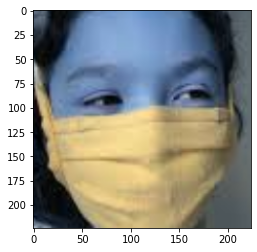

In [ ]:
sample_mask_img = cv2.imread('Face Mask Dataset/Test/WithMask/1565.png')
sample_mask_img = cv2.resize(sample_mask_img,(224,224))
plt.imshow(sample_mask_img)
sample_mask_img = np.reshape(sample_mask_img,[1,224,224,3])
sample_mask_img = sample_mask_img/255.0


In [ ]:
proba=model.predict(sample_mask_img)[0]
print(proba)
if proba[0]>0.90 :
  print(" With Mask ")

else:
  print("Without Mask")

1/1 [==============================] - 0s 17ms/step
[0.9805279  0.11508732]
 With Mask 


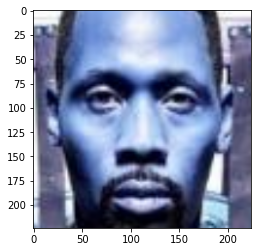

In [ ]:
sample_mask_img = cv2.imread('Face Mask Dataset/Test/WithoutMask/1.png')
sample_mask_img = cv2.resize(sample_mask_img,(224,224))
plt.imshow(sample_mask_img)
sample_mask_img = np.reshape(sample_mask_img,[1,224,224,3])
sample_mask_img = sample_mask_img/255.0


In [ ]:
proba=model.predict(sample_mask_img)[0]
print(proba)
if proba[1]>0.90 :
  print(" Without Mask ")

else:
  print("With Mask")

1/1 [==============================] - 0s 17ms/step
[0.07549129 0.98060566]
 Without Mask 


In [ ]:
sample_mask_img = cv2.imread('Face Mask Dataset/Test/WithMask/1565.png')
sample_mask_img = cv2.resize(sample_mask_img,(224,224))
plt.imshow(sample_mask_img)
sample_mask_img = np.reshape(sample_mask_img,[1,224,224,3])
sample_mask_img = sample_mask_img/255.0

In [ ]:

from prettytable import PrettyTable
  
# Specify the Column Names while initializing the Table
myTable = PrettyTable(["Model", "Train Accuracy ", " Validation Accuracy", "Test Accuracy"])
  
# Add rows
myTable.add_row(["Vgg16", "99.96", "99.62", "47.58"])
myTable.add_row(["Vgg19", "99.57", "99.75", "94.25"])
myTable.add_row(["ResNet101V2", "98.52", "98.50", "93.75"])

  
print(myTable)

+-------------+-----------------+----------------------+---------------+
|    Model    | Train Accuracy  |  Validation Accuracy | Test Accuracy |
+-------------+-----------------+----------------------+---------------+
|    Vgg16    |      99.96      |        99.62         |     47.58     |
|    Vgg19    |      99.57      |        99.75         |     94.25     |
| ResNet101V2 |      98.52      |        98.50         |     93.75     |
+-------------+-----------------+----------------------+---------------+
